#CH1701016 - LÊ DUY THÀNH
#Face Recognition Mini-Challenge 
- sử dụng face_recognition để training cũng như nhận diện face : https://face-recognition.readthedocs.io/en/latest/face_recognition.html
- reference : https://www.pyimagesearch.com/2018/06/18/face-recognition-with-opencv-python-and-deep-learning/


# Install thư viện face_recognition

In [0]:
#install face_recognition
!pip install face_recognition

# Import thư viện

In [0]:
import face_recognition
import cv2
import os
import os.path
import pickle
import matplotlib.pyplot as plt
import numpy as np
from urllib.request import urlopen
from google.colab import drive

# Hàm detect và nhận diện face từ ảnh input

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


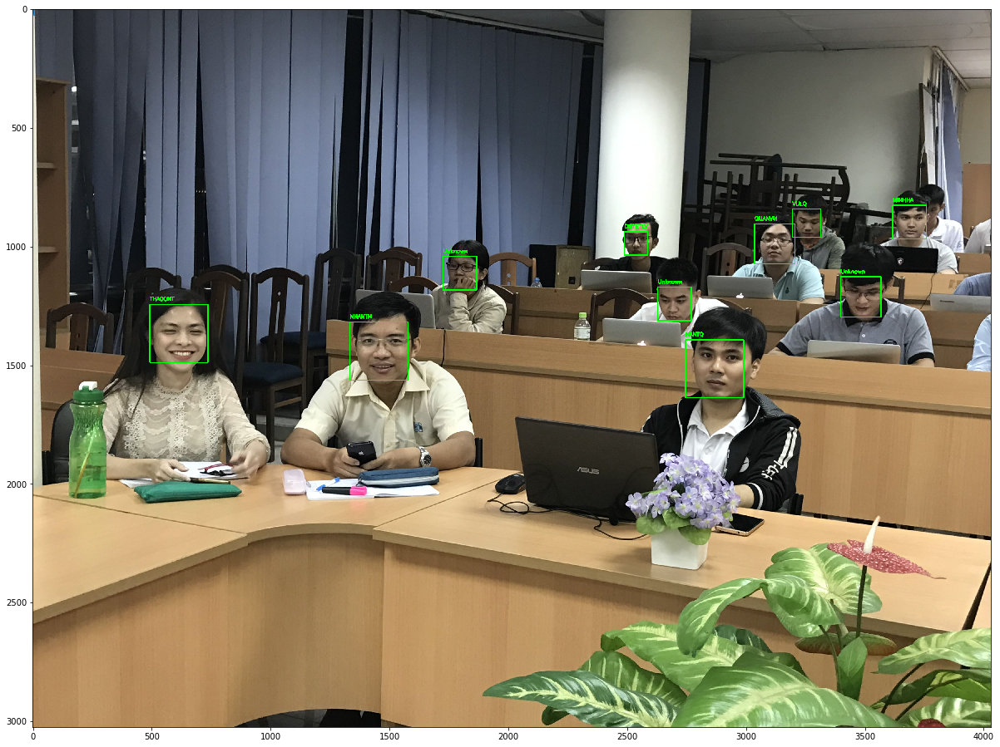

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


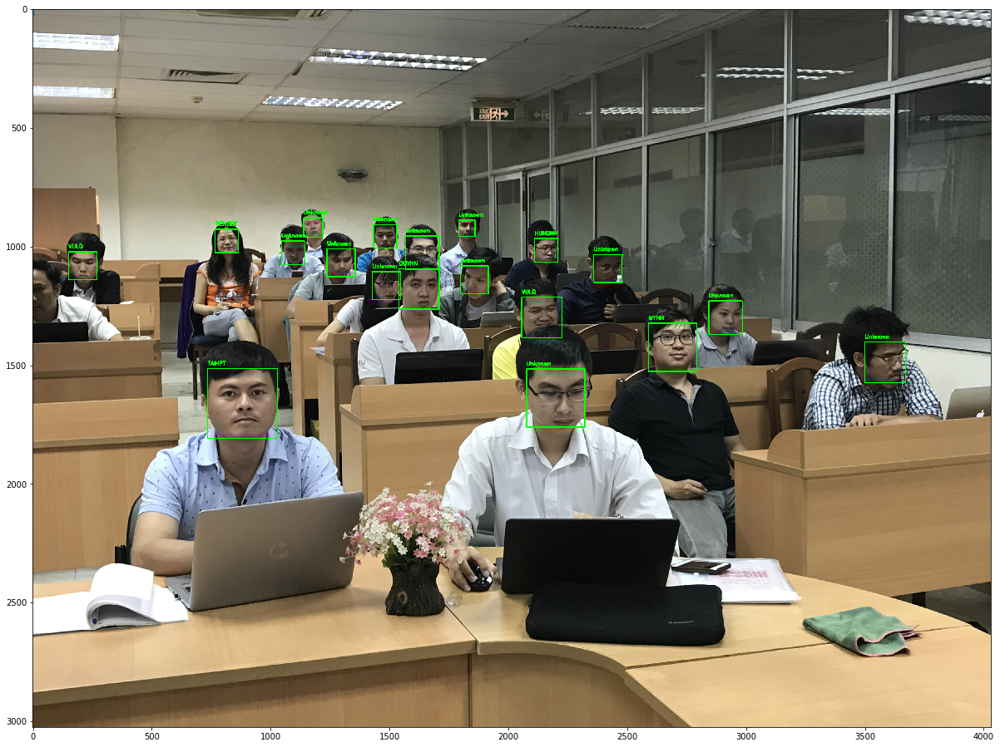

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


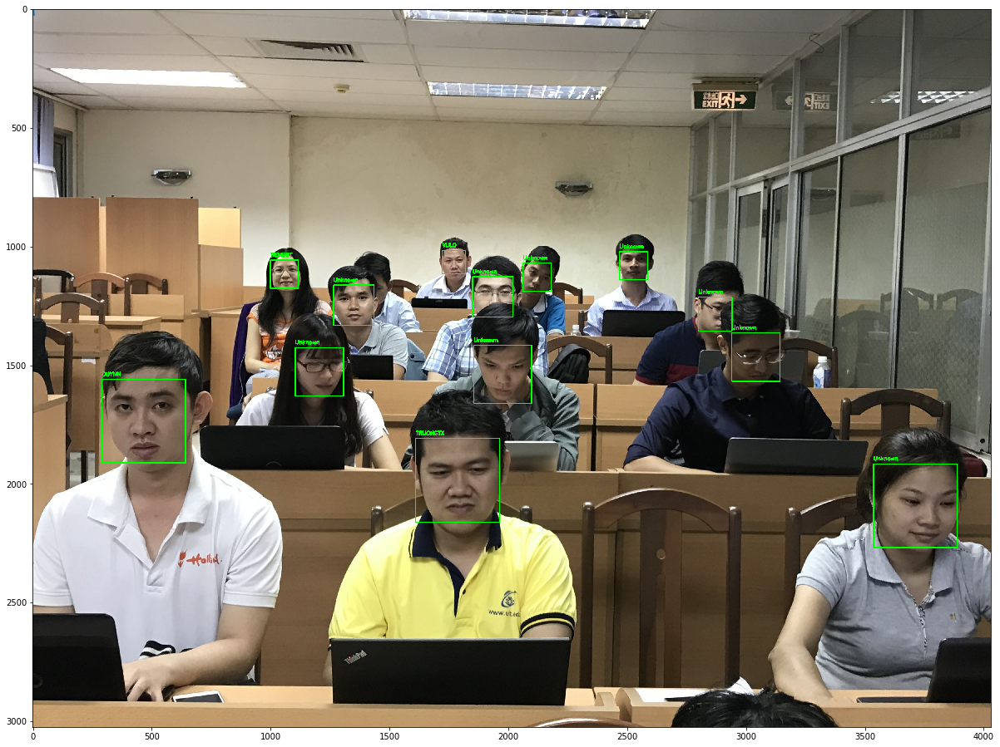

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


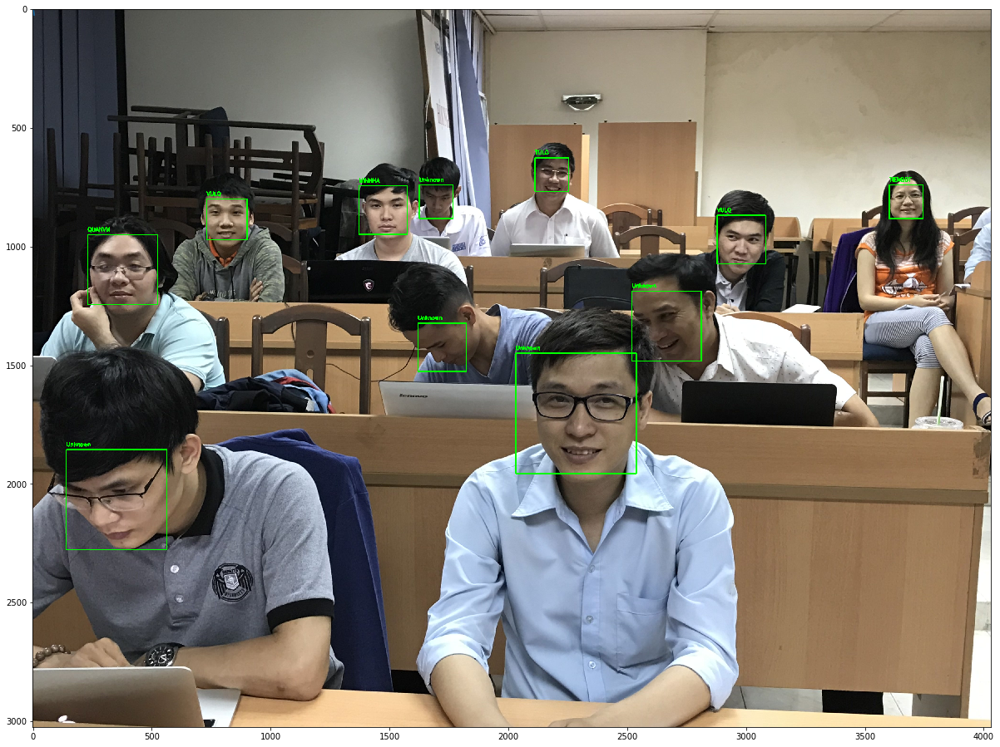

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


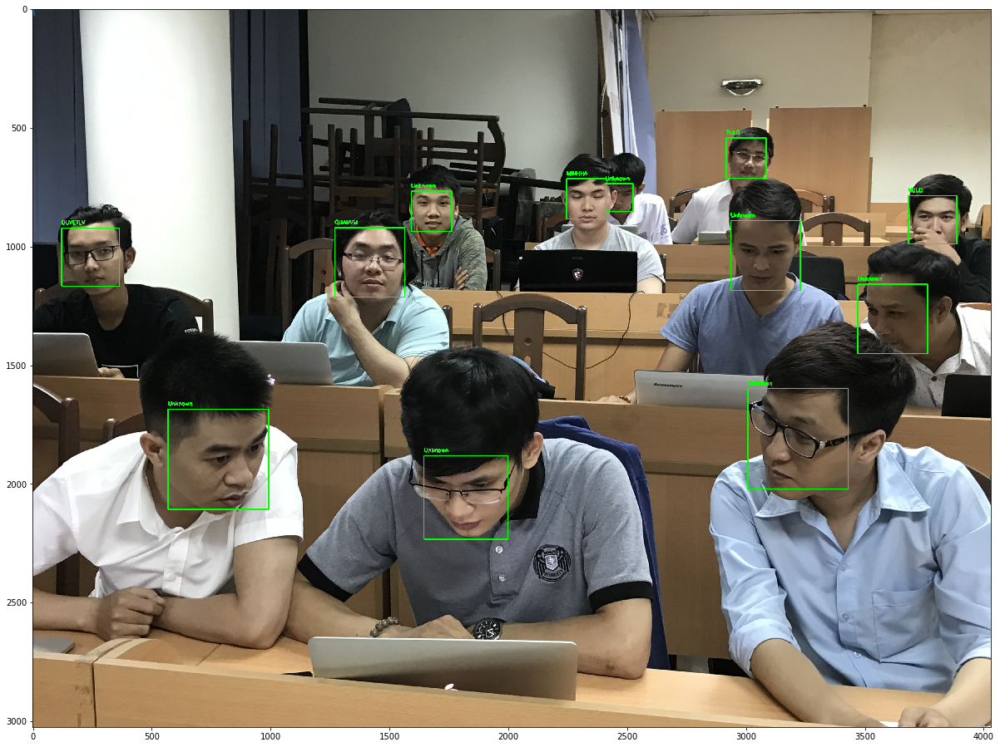

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


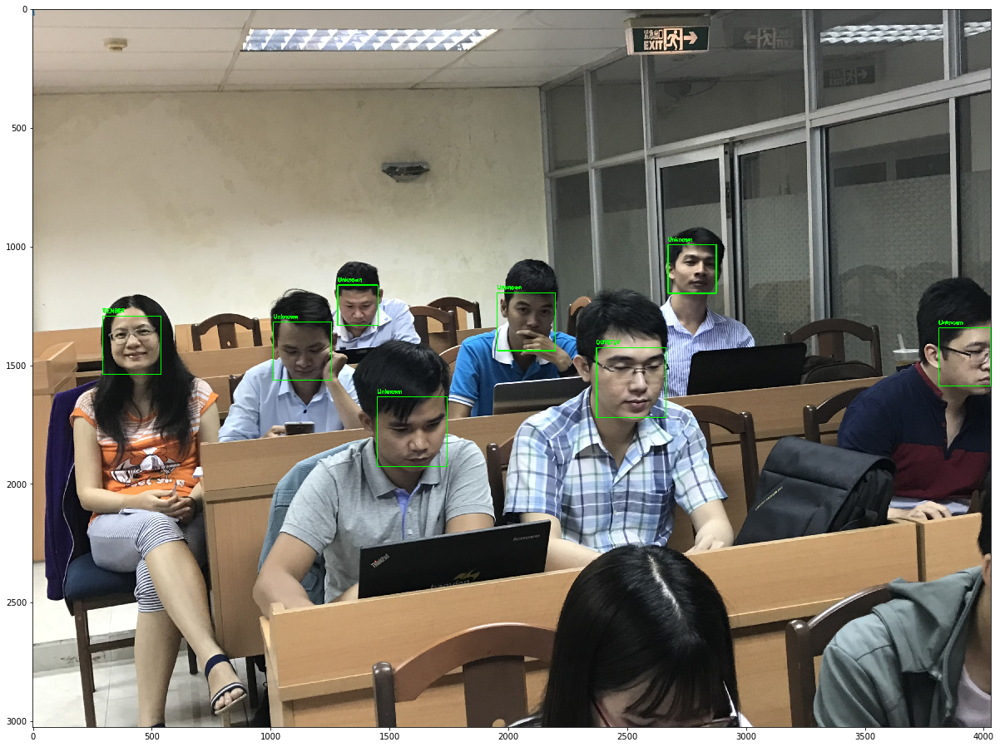

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
[INFO] recognizing faces...


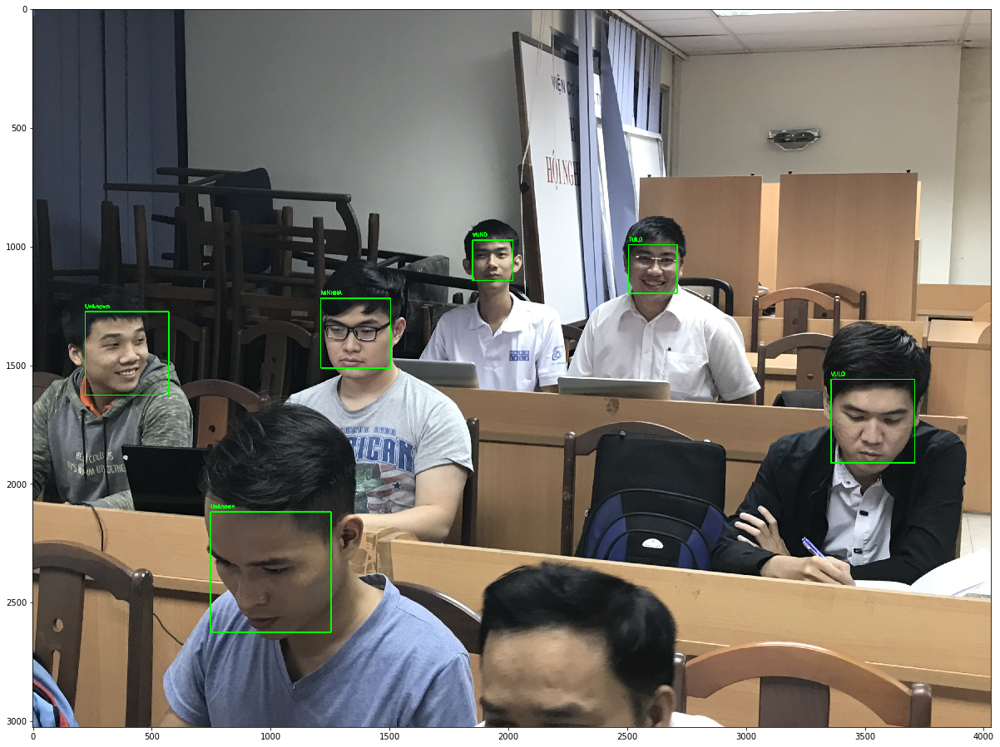

In [12]:
#Hàm detect và nhận diện face từ ảnh input
#input : link image chứa face
#output : image với các face được detect và nhận diện
#process : read image input -> read data model(trained) -> detect faces -> recognize face
#Hàm sẽ quét từng face trong image input và so sánh với face đã được encode trong model
#sử dụng hàm compare_faces của thư viện face_recognition
def detectFace(img_path):
    #enable quyền đọc vào driver chứa dữ liệu
    drive.mount('/content/gdrive')
    image = cv2.imread(img_path)
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    print("[INFO] recognizing faces...")
    #link data model trên driver
    path = '/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/encodings.pickle'
    data = []
    #read dât model
    with open(path, 'rb') as file:
      unpickler = pickle.Unpickler(file);
      data = unpickler.load();
      
    # sử dụng model cnn(convolutional neural network)  
    boxes = face_recognition.face_locations(rgb, model="cnn")
    #encoding image input được read thông qua cv2
    encodings = face_recognition.face_encodings(rgb, boxes)

    names = []
    #loop từng face trong image input
    for encoding in encodings:
        #compare face thông quan hàm compare_faces
        # tolerance = 0.4(0.4 là độ đo cho kết quả tốt nhất)
        matches = face_recognition.compare_faces(data["encodings"],encoding, 0.4)
        name = "Unknown"
        if True in matches:
            matchedIdxs = [i for (i, b) in enumerate(matches) if b]
            counts = {}
            for i in matchedIdxs:
                name = data["names"][i]
                counts[name] = counts.get(name, 0) + 1
            name = max(counts, key=counts.get)
        names.append(name)
  
    # loop over the recognized faces
    # location face và name lên image input
    for ((top, right, bottom, left), name) in zip(boxes, names):
        # draw the predicted face name on the image
        cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 4)
        y = top - 15 if top - 15 > 15 else top + 15
        cv2.putText(image, name, (left, y), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (0, 255, 0), 4)

    # show the output image
    
    img_cvt = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig= plt.figure(figsize=(22,15))
    axes= fig.add_axes([0.1,0.1,0.8,0.8])
    x= [1,2,3,4,5]
    y=[x**2 for x in x]
    axes.plot(x,y)
    plt.imshow(img_cvt)
    plt.show()

# Hàm train model

In [0]:
#hàm train model
#sử dụng thư viện face_recognition để train model
#face sẽ được đọc từ dataset
#endcodeing bằng face_recognition
#face sau khi được encode + name(từ folder chứa image) sẽ được lưu vào file encodings.pickle
#cấu trúc có dạng : {"encodings": image_encoding, "names": name face}
def trainModel():
    path = './dataset'
    knownEncodings = []
    knownNames = []
    # r=root, d=directories, f = files
    index = 0
    print("start load dataset to training")
    for r, d, f in os.walk(path):
        for folder in d:
            for r1, d1, f1 in os.walk(os.path.join(r, folder)):
                for file in f1:
                    print(os.path.join(r, folder, file))
                    image_loaded = face_recognition.load_image_file(os.path.join(r, folder, file))
                    face_encodings = face_recognition.face_encodings(image_loaded)
                    arrFile.append(face_encoding)
                    # loop over the encodings
                    for encoding in face_encodings:
                        # add each encoding + name to our set of known names and
                        # encodings
                        knownEncodings.append(encoding)
                        knownNames.append(name)
                        
    print("encoding done")
    print("start write data to file")
    print("[INFO] serializing encodings...")
    data = {"encodings": knownEncodings, "names": knownNames}
    f = open("encodings.pickle", "wb")
    f.write(pickle.dumps(data))
    f.close()
    print("training done")

# Testing

In [0]:
#test với 1 số image    
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5326.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5327.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5328.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5329.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5330.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5331.jpg')
detectFace('/content/gdrive/My Drive/Colab Notebooks/CV_COLAB/Final/input/IMG_5332.jpg')

# Kết luận
- kết quả detect cũng như nhận diện chưa cao do chất lượng dữ liệu training chưa tốt
- Việc xử lý dữ liệu, đọc dữ liệu chưa được tối ưu nên khá chậm cho dù dữ liệu không nhiều